# Inputs, transformation and cleaning

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.style as style
import numpy as np

from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns # data visualization library  
import plotly.express as px

### <font color='red'>Clean</font> #

In [2]:
trim_df = pd.read_csv("outputs/trim_df.csv")
trim_df['X']=trim_df['Unnamed: 0']
trim_df.drop(list(filter(lambda x: x.startswith('Unname'), trim_df)), axis = 1, inplace = True)
trim_df.set_index('X', inplace=True)
trim_df.shape

(6501, 1513)

In [3]:
trim_df.head()

,SQFT,BASEMNT,ACT1PCT,ACT2PCT,ACT3PCT,EDSEAT,FDSEAT,OCCUPYP,LODOCCP,WKHRS,...,RFGCOMPN,RFGCOMPN_bin.2,SERVERN_bin..1,SERVERN,SERVERN_bin.2,TVVIDEON_bin..1,TVVIDEON,TVVIDEON_bin.2,DD,NEUI
X,,,,,,,,,,,,,,,,,,,,,
0,2400.0,0.0,100,0,0,0,0,0,0,16,...,0.0,0,0,0,0,0,0.0,0.0,7747,0.000001
1,114000.0,0.0,100,0,0,0,0,42,0,72,...,10.0,0,0,7,0,0,49.0,0.0,5293,0.000010
2,2550.0,0.0,100,0,0,0,0,0,0,40,...,0.0,0,0,0,0,0,0.0,0.0,5978,0.000003
3,500000.0,1.0,100,0,0,0,0,0,56,168,...,8.0,0,0,4,0,0,0.0,1.0,4689,0.000021
4,30000.0,0.0,50,50,0,0,0,100,0,65,...,2.0,0,0,10,0,0,1.0,0.0,4957,0.000013


In [4]:
# Create correlation matrix
corr_matrix = trim_df.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]

# Drop features 
trim_df.drop(to_drop, axis=1, inplace=True)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """


In [5]:
slim_df = trim_df

slim_df.to_csv('outputs/slim_df.csv')
slim_df.shape

(6501, 1099)

In [6]:
#final_df = slim_df[['NEUI','FLCEILHT_bin','FDSEAT','MFBTU','SQFT','RFGCOMPN_bin','DD','NESLTR_bin','ANYEGY','ELUSED','WBOARDS',
#                    'NOCC_bin','HCBED','NELVTR_bin','HEATP','PLGCTRL','ELBTU','RFGWIN','PBAPLUS','CUBE','RDHTNF','LODGRM',
#                    'OPEN24','NRSBED','PBA','LABEQP','GLSSPC','RFTILT','CHWT','BULBP','DCNTRSFC','OPNMF','RFGRES','RFGCOMP',
#                    'NWMNHT','HDD65','BOOSTWT','COPIER','CLVDEM','MONUSE','MAINHT','OWNTYPE','TINT','FKGENR','PRUSED','CTSCAN',
#                    'BLRRAD','MEDEQP','ELHT2','ESCLTR','STRLZR','RDLTNF']]

final_df = slim_df[['NEUI','WOHT2..1',
 'PBA.15',
 'RFGICN',
 'DD',
 'HTRCHLR..1',
 'PBAPLUS.32',
 'WOCOOK..1',
 'WKHRS',
 'WOGENR..1',
 'PBA.6',
 'WOUSED.2',
 'NGUSED.1',
 'WOOTH..1',
 'PBA.16',
 'COMANU..1',
 'PBAPLUS.33',
 'WOWATR..1',
 'PBA.5',
 'COCOOK..1',
 'STHW.2',
 'WOSRC..1',
 'SQFTC.2',
 'WOAMT..1',
 'WKHRSC.1',
 'COWATR..1',
 'LODGRM',
 'COOTH..1',
 'MONUSE.12',
 'DRYCL..1',
 'LOHRPC.4',
 'COHT1..1',
 'PBAPLUS.48',
 'COUSED.2',
 'LABEQP.1',
 'ELUSED.1',
 'NGSRC..1',
 'COURT..1',
 'BOILP',
 'COGENR..1',
 'SQFT',
 'COHT2..1',
 'NWKER',
 'WOHT1..1',
 'BLDPLT.2',
 'WOMANU..1',
 'PBA.91',
 'RFGSTP',
 'PBSEAT',
 'FKHT2.2',
 'RDHTNF.2',
 'RFGRES.2',
 'RFTILT.1',
 'OPEN24.1',
 'WKHRSC.6',
 'PRCOOK.1',
 'NWKERC.4',
 'RFGWI.1',
 'DCNTRSFC.5',
 'RFGCOMPN',
 'OWNTYPE.3',
 'DHRAD.2',
 'ELEVTR.2',
 'CLVVAV.1',
 'FKHT1.1',
 'HT2.1',
 'DCNTRSFC.2',
 'BOOSTWT.0',
 'STRLZR.2',
 'GLSSPC.3',
 'PBA.12',
 'GLSSPC.4',
 'GLSSPC.5',
 'MAINT.1',
 'OWNOCC.3',
 'HWTRM.1',
 'EVAPCL.1',
 'MAINCL.7',
 'PCTRMC.10',
 'NWKERC.11',
 'HCBED_bin.2',
 'FDPREP.1',
 'NGWATR.1',
 'RENRDC.1',
 'FURNAC.2',
 'NWKERC.5',
 'ACWNWP',
 'NGWATR.2',
 'FACDST.1',
 'HWHT1.1',
 'COPIER.1',
 'OPNMF.2',
 'PKGFURN.1',
 'LTEXPC.4',
 'TRNGRM.2',
 'MRI.2',
 'FACACT.13',
 'CHLDUCT.1',
 'LAPTPC.1',
 'SQFTC.7',
 'SQFTC.8',
 'WLCNS.6',
 'DAYHARV.2',
 'FASTFD.1',
 'SUNGLS.1',
 'RFGSTO.1',
 'RFCNS.6',
 'RFGWIN',
 'FACACT.5',
 'WHRECOV.2',
 'SHUNIT.1',
 'RGSTR.1']]

final_df.to_csv('outputs/final_df.csv')
final_df.shape

(6501, 112)

### <font color='red'>See whats in it</font> #

In [9]:
final_df = pd.read_csv("outputs/final_df.csv")
#final_df['X']=final_df['Unnamed: 0']
#final_df.drop('Unnamed: 0', axis=1, inplace=True) 
#final_df.set_index('X', inplace=True)
#pandas_profiling.ProfileReport(trim_df)
final_df.set_index('X', inplace=True)
final_df["EUI"] = final_df["EUI"]*1000
final_df["EUI"].describe()

KeyError: 'EUI'

In [8]:
#slim_df["NEUI"] = np.log(slim_df["NEUI"])

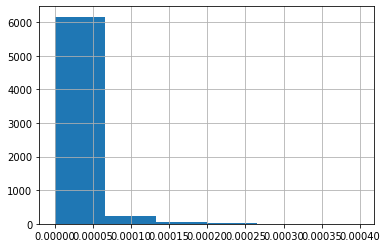

In [9]:
final_df["NEUI"].hist(bins=6)
plt.show()

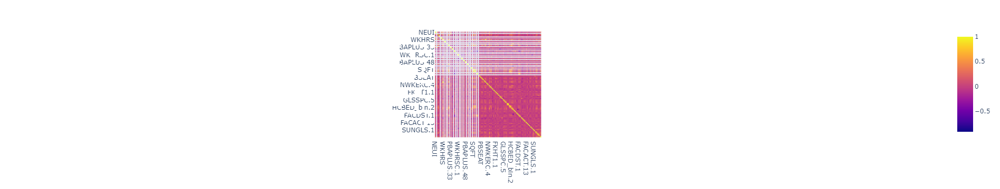

In [10]:
fig = px.imshow(final_df.corr())
fig.show()

In [11]:
cor = final_df.corr()
#Correlation with Y variable
cor_target = abs(cor["NEUI"])
#Selecting highly correlated features
relevant_features = cor_target[cor_target>0.1]
relevant_features

NEUI           1.000000
PBA.15         0.400625
RFGICN         0.215362
DD             0.207154
PBAPLUS.32     0.360511
WKHRS          0.322863
PBA.6          0.131693
NGUSED.1       0.198548
PBA.16         0.247070
PBAPLUS.33     0.268984
PBA.5          0.172120
MONUSE.12      0.102883
LOHRPC.4       0.158843
LABEQP.1       0.178325
NGSRC..1       0.167461
SQFT           0.111208
NWKER          0.154762
BLDPLT.2       0.105611
FKHT2.2        0.122471
RDHTNF.2       0.106547
RFGRES.2       0.152039
RFTILT.1       0.147242
OPEN24.1       0.218835
WKHRSC.6       0.178487
RFGWI.1        0.344578
RFGCOMPN       0.107896
DHRAD.2        0.103366
ELEVTR.2       0.103113
CLVVAV.1       0.133038
PBA.12         0.103406
MAINT.1        0.112047
HWTRM.1        0.213613
HCBED_bin.2    0.200570
FDPREP.1       0.108729
NGWATR.1       0.205961
FACDST.1       0.151869
OPNMF.2        0.100340
CHLDUCT.1      0.121139
RFGSTO.1       0.113818
RFGWIN         0.228236
RGSTR.1        0.265098
Name: NEUI, dtyp

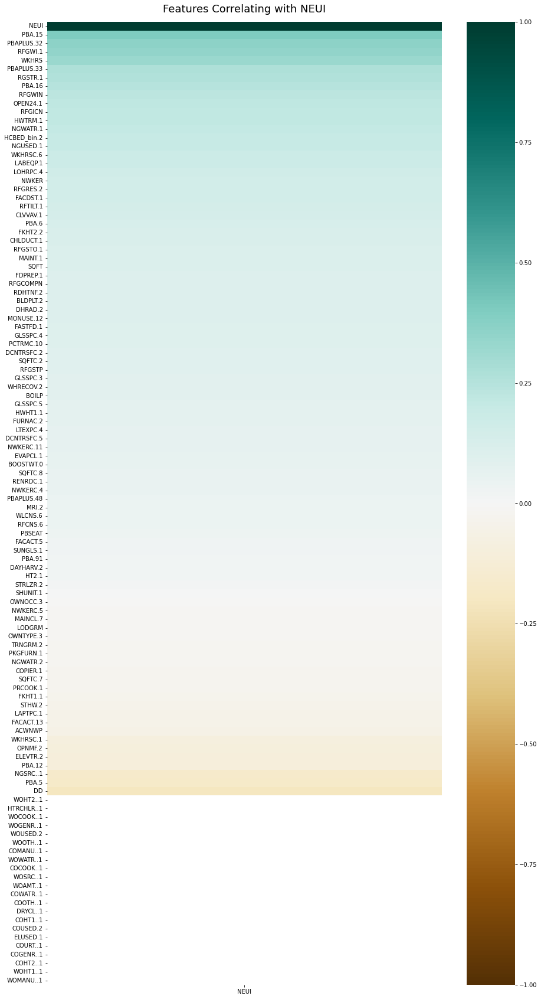

In [12]:
plt.figure(figsize=(15, 30))
heatmap = sns.heatmap(final_df.corr()[['NEUI']].sort_values(by='NEUI', ascending=False), vmin=-1, vmax=1, annot=False, cmap='BrBG')
heatmap.set_title('Features Correlating with NEUI', fontdict={'fontsize':18}, pad=16);

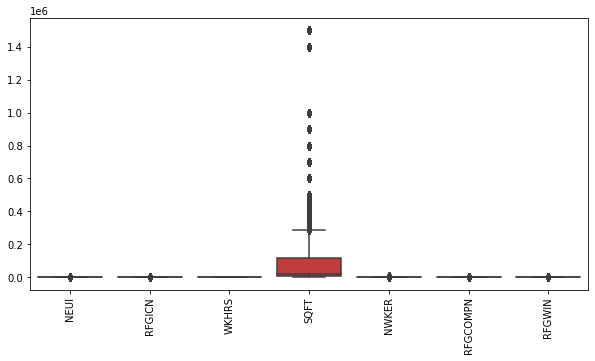

In [13]:
plt.figure(figsize=(10,5))
sns.boxplot(data=final_df[['NEUI','RFGICN','WKHRS','SQFT','NWKER','RFGCOMPN','RFGWIN']])
plt.xticks(rotation=90)
plt.show()

# Rank features

### <font color='red'>Iter 1</font> #

In [14]:
final_df = pd.read_csv("outputs/final_df.csv")
final_df.set_index('X', inplace=True)
final_df.head()

,NEUI,WOHT2..1,PBA.15,RFGICN,DD,HTRCHLR..1,PBAPLUS.32,WOCOOK..1,WKHRS,WOGENR..1,...,DAYHARV.2,FASTFD.1,SUNGLS.1,RFGSTO.1,RFCNS.6,RFGWIN,FACACT.5,WHRECOV.2,SHUNIT.1,RGSTR.1
X,,,,,,,,,,,,,,,,,,,,,
0,0.000001,1,0.0,0,7747,1,0.0,1,16,1,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.000010,1,0.0,2,5293,1,0.0,1,72,1,...,1.0,1.0,0.0,0.0,1.0,2.0,0.0,1.0,0.0,1.0
2,0.000003,1,1.0,0,5978,1,0.0,1,40,1,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.000021,1,0.0,21,4689,1,0.0,1,168,1,...,1.0,1.0,0.0,0.0,0.0,12.0,0.0,1.0,0.0,1.0
4,0.000013,1,0.0,0,4957,1,0.0,1,65,1,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [15]:
log_final_df = final_df
log_final_df[['NEUI','RFGICN','WKHRS','SQFT','NWKER','RFGCOMPN','RFGWIN']] = np.log(log_final_df[['NEUI','RFGICN','WKHRS','SQFT','NWKER','RFGCOMPN','RFGWIN']]+1)
log_final_df.isnull().values.any()

False

In [16]:
np.isinf(log_final_df).values.any()

False

In [17]:
final_df = pd.read_csv("outputs/final_df.csv")
final_df.set_index('X', inplace=True)

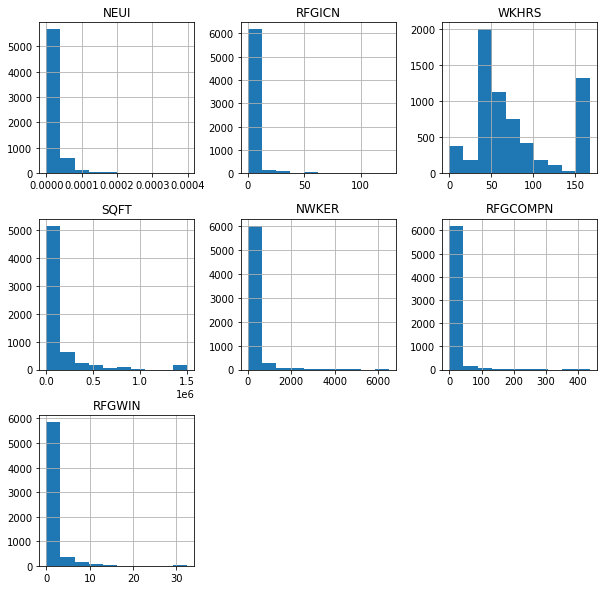

In [18]:
final_df[['NEUI','RFGICN','WKHRS','SQFT','NWKER','RFGCOMPN','RFGWIN']].hist(figsize=(10,10))
plt.show()

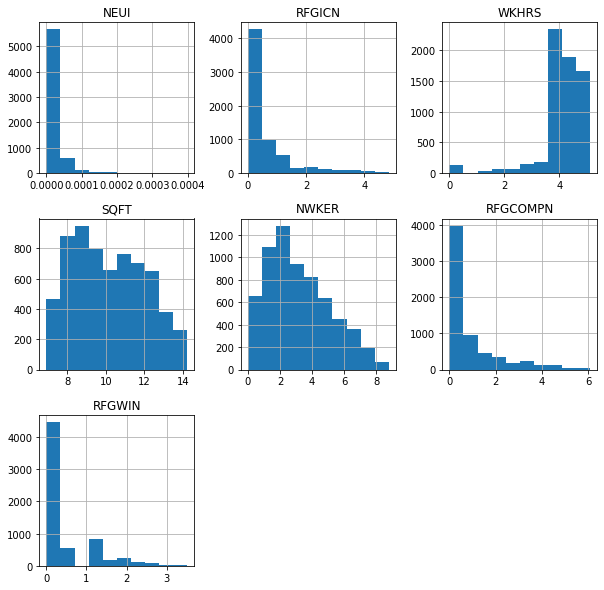

In [19]:
log_final_df[['NEUI','RFGICN','WKHRS','SQFT','NWKER','RFGCOMPN','RFGWIN']].hist(figsize=(10,10))
plt.show()

In [ ]:
#log_final_df.hist(figsize=(20,20))
#plt.show()

In [21]:
y = log_final_df['NEUI']
X = log_final_df

In [10]:
X.drop('NEUI', axis=1, inplace=True)

In [11]:
# set up our regressor. Today we shall be using the random forest
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators=100, max_depth=10)

In [12]:
# perform a scikit-learn Recursive Feature Elimination (RFE)
from sklearn.feature_selection import RFE
# here we want only one final feature, we do this to produce a ranking
n_features_to_select = 1
rfe = RFE(regressor, n_features_to_select=n_features_to_select)
rfe.fit(X, y)

RFE(estimator=RandomForestRegressor(max_depth=10), n_features_to_select=1)

In [13]:
#===========================================================================
# now print out the features in order of ranking
#===========================================================================
from operator import itemgetter
features = X.columns.to_list()
for x, y in (sorted(zip(rfe.ranking_ , features), key=itemgetter(0))):
    print(x, y)

1 DD
2 WKHRS
3 PBA.15
4 NWKER
5 SQFT
6 PBA.16
7 RFGWIN
8 NGUSED.1
9 RFGICN
10 PBAPLUS.48
11 RFGCOMPN
12 PBA.6
13 PBAPLUS.32
14 NGWATR.1
15 PBA.91
16 RFCNS.6
17 NGSRC..1
18 LABEQP.1
19 WLCNS.6
20 CLVVAV.1
21 PBA.5
22 BOILP
23 GLSSPC.4
24 RFGSTP
25 BLDPLT.2
26 RFTILT.1
27 RDHTNF.2
28 HWTRM.1
29 RFGRES.2
30 MAINT.1
31 STHW.2
32 HT2.1
33 DCNTRSFC.5
34 LTEXPC.4
35 RFGWI.1
36 NWKERC.4
37 LOHRPC.4
38 PBAPLUS.33
39 GLSSPC.3
40 LAPTPC.1
41 SUNGLS.1
42 FKHT2.2
43 STRLZR.2
44 GLSSPC.5
45 ACWNWP
46 NGWATR.2
47 OWNTYPE.3
48 FASTFD.1
49 HWHT1.1
50 TRNGRM.2
51 SQFTC.2
52 FURNAC.2
53 CHLDUCT.1
54 SQFTC.7
55 PKGFURN.1
56 COPIER.1
57 ELEVTR.2
58 RFGSTO.1
59 MONUSE.12
60 DHRAD.2
61 FACDST.1
62 RGSTR.1
63 SHUNIT.1
64 PBA.12
65 EVAPCL.1
66 PBSEAT
67 WHRECOV.2
68 WKHRSC.6
69 DCNTRSFC.2
70 RENRDC.1
71 NWKERC.5
72 OPEN24.1
73 FACACT.5
74 PRCOOK.1
75 SQFTC.8
76 MRI.2
77 OWNOCC.3
78 OPNMF.2
79 BOOSTWT.0
80 FDPREP.1
81 PCTRMC.10
82 DAYHARV.2
83 LODGRM
84 HCBED_bin.2
85 FKHT1.1
86 NWKERC.11
87 FACACT.13
88 MAINCL

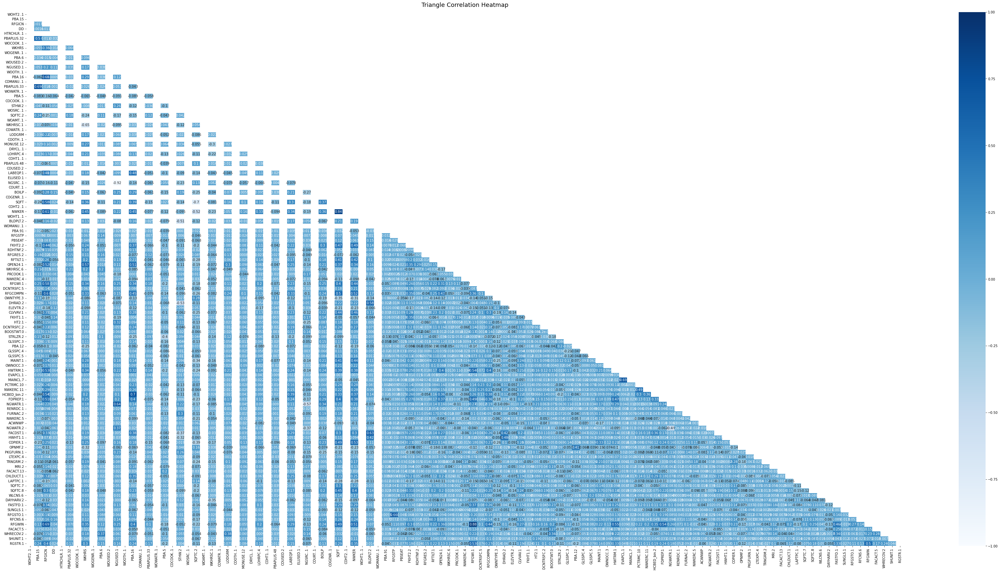

In [17]:
plt.figure(figsize=(60, 30))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(log_final_df.corr(), dtype=bool))
heatmap = sns.heatmap(log_final_df.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='Blues')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16);
plt.savefig('elbow.png')

In [3]:
log_final_df = pd.read_csv("outputs/log_final_df.csv")
log_final_df.set_index('X', inplace=True)
log_final_df.head()

,NEUI,WOHT2..1,PBA.15,RFGICN,DD,HTRCHLR..1,WOCOOK..1,WKHRS,WOGENR..1,PBA.6,...,WLCNS.6,DAYHARV.2,FASTFD.1,SUNGLS.1,RFCNS.6,RFGWIN,FACACT.5,WHRECOV.2,SHUNIT.1,RGSTR.1
X,,,,,,,,,,,,,,,,,,,,,
0,0.000001,1,0.0,0.000000,7747,1,1,2.833213,1,0.0,...,0.0,1.0,0.0,1.0,0.0,0.000000,0.0,0.0,0.0,0.0
1,0.000010,1,0.0,1.098612,5293,1,1,4.290459,1,0.0,...,0.0,1.0,1.0,0.0,1.0,1.098612,0.0,1.0,0.0,1.0
2,0.000003,1,1.0,0.000000,5978,1,1,3.713572,1,0.0,...,0.0,1.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0
3,0.000021,1,0.0,3.091042,4689,1,1,5.129899,1,0.0,...,1.0,1.0,1.0,0.0,0.0,2.564949,0.0,1.0,0.0,1.0
4,0.000013,1,0.0,0.000000,4957,1,1,4.189655,1,0.0,...,0.0,1.0,0.0,1.0,1.0,0.000000,0.0,0.0,0.0,0.0


/opt/conda/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


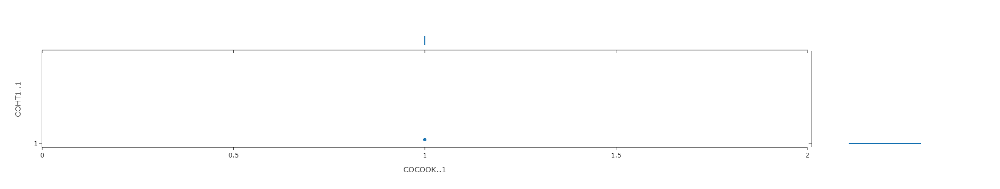

In [5]:
px.scatter(log_final_df, x='COCOOK..1', y='COHT1..1', color=None, marginal_y="violin", marginal_x="box", trendline="ols", template="simple_white")

### <font color='red'>Iter 2</font> #

In [22]:
final_df = pd.read_csv("outputs/final_df.csv")
final_df.set_index('X', inplace=True)
final_df.head()

,NEUI,WOHT2..1,PBA.15,RFGICN,DD,HTRCHLR..1,PBAPLUS.32,WOCOOK..1,WKHRS,WOGENR..1,...,DAYHARV.2,FASTFD.1,SUNGLS.1,RFGSTO.1,RFCNS.6,RFGWIN,FACACT.5,WHRECOV.2,SHUNIT.1,RGSTR.1
X,,,,,,,,,,,,,,,,,,,,,
0,0.000001,1,0.0,0,7747,1,0.0,1,16,1,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.000010,1,0.0,2,5293,1,0.0,1,72,1,...,1.0,1.0,0.0,0.0,1.0,2.0,0.0,1.0,0.0,1.0
2,0.000003,1,1.0,0,5978,1,0.0,1,40,1,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.000021,1,0.0,21,4689,1,0.0,1,168,1,...,1.0,1.0,0.0,0.0,0.0,12.0,0.0,1.0,0.0,1.0
4,0.000013,1,0.0,0,4957,1,0.0,1,65,1,...,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [23]:
final_df.drop(list(filter(lambda x: x.startswith('NWKERC'), final_df)), axis = 1, inplace = True)
final_df.drop(list(filter(lambda x: x.startswith('PBAPLUS'), final_df)), axis = 1, inplace = True)
final_df.drop(list(filter(lambda x: x.startswith('SQFTC'), final_df)), axis = 1, inplace = True)
final_df.drop(list(filter(lambda x: x.startswith('RFGSTO'), final_df)), axis = 1, inplace = True)
final_df.drop('RFGWI.1', axis=1, inplace=True)
final_df.drop('WKHRSC.1', axis=1, inplace=True)
final_df.drop('NGWATR.2', axis=1, inplace=True)
final_df.drop('WKHRSC.6', axis=1, inplace=True)

In [24]:
final_df.to_csv('outputs/final_df.csv')

In [25]:
log_final_df = final_df
log_final_df[['NEUI','RFGICN','WKHRS','SQFT','NWKER','RFGCOMPN','RFGWIN']] = np.log(log_final_df[['NEUI','RFGICN','WKHRS','SQFT','NWKER','RFGCOMPN','RFGWIN']]+1)
log_final_df.isnull().values.any()

False

In [26]:
np.isinf(log_final_df).values.any()

False

In [51]:
y = log_final_df['NEUI']
X = log_final_df
X.drop('NEUI', axis=1, inplace=True)

In [16]:
# set up our regressor. Today we shall be using the random forest
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators=100, max_depth=10)

In [17]:
# perform a scikit-learn Recursive Feature Elimination (RFE)
from sklearn.feature_selection import RFE
# here we want only one final feature, we do this to produce a ranking
n_features_to_select = 1
rfe = RFE(regressor, n_features_to_select=n_features_to_select)
rfe.fit(X, y)

RFE(estimator=RandomForestRegressor(max_depth=10), n_features_to_select=1)

In [18]:
#===========================================================================
# now print out the features in order of ranking
#===========================================================================
from operator import itemgetter
features = X.columns.to_list()
for x, y in (sorted(zip(rfe.ranking_ , features), key=itemgetter(0))):
    print(x, y)

1 DD
2 SQFT
3 WKHRS
4 PBA.15
5 NWKER
6 PBA.16
7 RFGWIN
8 NGUSED.1
9 RFGICN
10 RFGCOMPN
11 HWTRM.1
12 BOILP
13 PBA.6
14 NGWATR.1
15 RFGSTP
16 NGSRC..1
17 PBA.5
18 LABEQP.1
19 CLVVAV.1
20 RFGRES.2
21 RFTILT.1
22 RFCNS.6
23 PBA.91
24 GLSSPC.4
25 MAINT.1
26 BLDPLT.2
27 GLSSPC.5
28 RDHTNF.2
29 STRLZR.2
30 STHW.2
31 DCNTRSFC.5
32 HT2.1
33 WLCNS.6
34 LOHRPC.4
35 LTEXPC.4
36 ACWNWP
37 SUNGLS.1
38 GLSSPC.3
39 OWNTYPE.3
40 LAPTPC.1
41 HWHT1.1
42 COPIER.1
43 FKHT2.2
44 RFGWI.1
45 TRNGRM.2
46 PBA.12
47 PKGFURN.1
48 NGWATR.2
49 CHLDUCT.1
50 WHRECOV.2
51 FACDST.1
52 RENRDC.1
53 FURNAC.2
54 FASTFD.1
55 RGSTR.1
56 ELEVTR.2
57 SHUNIT.1
58 DHRAD.2
59 MONUSE.12
60 DCNTRSFC.2
61 BOOSTWT.0
62 PBSEAT
63 WKHRSC.6
64 PRCOOK.1
65 EVAPCL.1
66 OPEN24.1
67 MRI.2
68 OPNMF.2
69 OWNOCC.3
70 FDPREP.1
71 FACACT.5
72 PCTRMC.10
73 DAYHARV.2
74 HCBED_bin.2
75 MAINCL.7
76 FKHT1.1
77 FACACT.13
78 LODGRM
79 WKHRSC.1
80 WOOTH..1
81 WOUSED.2
82 WOGENR..1
83 WOCOOK..1
84 HTRCHLR..1
85 COGENR..1
86 WOWATR..1
87 COHT1..1
88 DRYC

In [27]:
ranked_df = log_final_df[['NEUI','DD','SQFT','WKHRS','PBA.15','NWKER','PBA.16','RFGWIN','NGUSED.1','RFGICN','RFGCOMPN',
                      'HWTRM.1','BOILP','PBA.6','NGWATR.1','RFGSTP','NGSRC..1','PBA.5','LABEQP.1','CLVVAV.1','RFGRES.2',
                      'RFTILT.1','RFCNS.6','PBA.91','GLSSPC.4']]

In [33]:
#ranked_df2 = log_final_df[['NEUI','DD','SQFT','WKHRS','PBA.15','NWKER','PBA.16','RFGWIN','NGUSED.1','RFGICN','RFGCOMPN']]

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



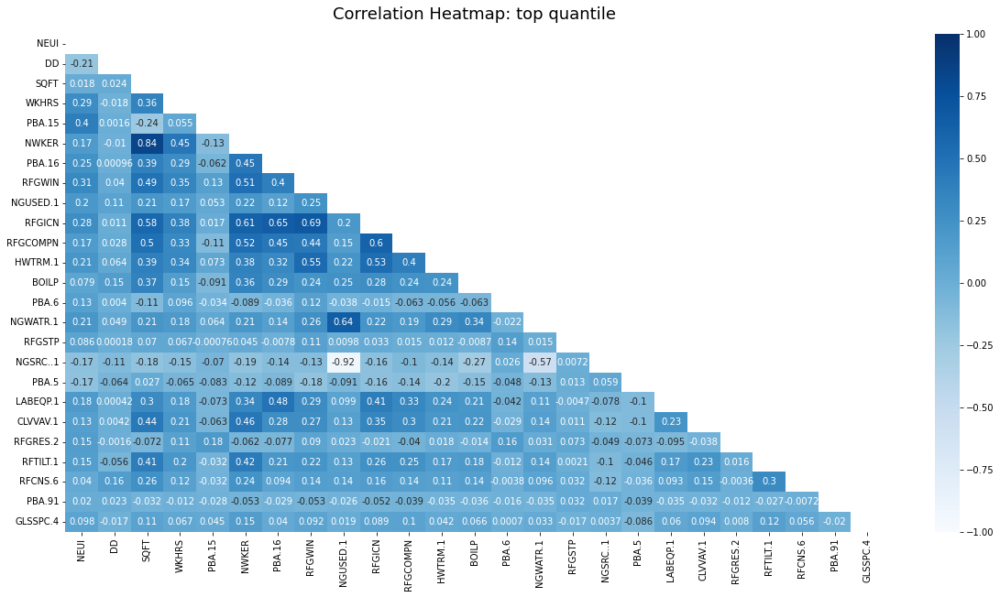

In [30]:
plt.figure(figsize=(20, 10))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(ranked_df.corr(), dtype=np.bool))
heatmap = sns.heatmap(ranked_df.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='Blues')
heatmap.set_title('Correlation Heatmap: top quantile', fontdict={'fontsize':18}, pad=16);

In [32]:
log_final_df.to_csv('outputs/log_final_df.csv')
ranked_df.to_csv('outputs/ranked_df.csv')
#ranked_df2.to_csv('outputs/ranked_df2.csv')

In [56]:
log_final_df = pd.read_csv("outputs/log_final_df.csv")
log_final_df.set_index('X', inplace=True)
log_final_df.head()

,NEUI,WOHT2..1,PBA.15,RFGICN,DD,HTRCHLR..1,WOCOOK..1,WKHRS,WOGENR..1,PBA.6,...,WLCNS.6,DAYHARV.2,FASTFD.1,SUNGLS.1,RFCNS.6,RFGWIN,FACACT.5,WHRECOV.2,SHUNIT.1,RGSTR.1
X,,,,,,,,,,,,,,,,,,,,,
0,0.000001,1,0.0,0.000000,7747,1,1,2.833213,1,0.0,...,0.0,1.0,0.0,1.0,0.0,0.000000,0.0,0.0,0.0,0.0
1,0.000010,1,0.0,1.098612,5293,1,1,4.290459,1,0.0,...,0.0,1.0,1.0,0.0,1.0,1.098612,0.0,1.0,0.0,1.0
2,0.000003,1,1.0,0.000000,5978,1,1,3.713572,1,0.0,...,0.0,1.0,0.0,0.0,0.0,0.693147,0.0,0.0,0.0,0.0
3,0.000021,1,0.0,3.091042,4689,1,1,5.129899,1,0.0,...,1.0,1.0,1.0,0.0,0.0,2.564949,0.0,1.0,0.0,1.0
4,0.000013,1,0.0,0.000000,4957,1,1,4.189655,1,0.0,...,0.0,1.0,0.0,1.0,1.0,0.000000,0.0,0.0,0.0,0.0


In [53]:
hist1 = final_df[['SQFT','NWKER']]
hist2 = log_final_df[['SQFT','NWKER']]

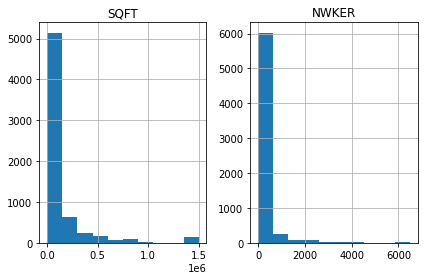

In [59]:
def draw_histograms(df, variables, n_rows, n_cols):
    fig=plt.figure()
    for i, var_name in enumerate(variables):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        df[var_name].hist(bins=10,ax=ax)
        ax.set_title(var_name)
    fig.tight_layout()  # Improves appearance a bit.
    plt.show()

#test = pd.DataFrame(np.random.randn(30, 9), columns=map(str, range(9)))
draw_histograms(hist1, hist1.columns, 1, 2)

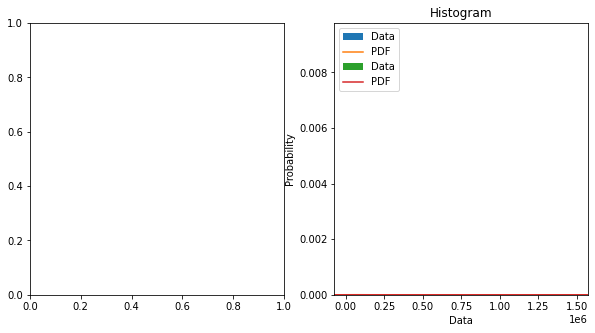

In [51]:
import scipy.stats as st

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

plt.hist(final_df['SQFT'], density=True, bins=82, label="Data")
mn, mx = plt.xlim()
plt.xlim(mn, mx)
kde_xs = np.linspace(mn, mx, 300)
kde = st.gaussian_kde(final_df['SQFT'])
plt.plot(kde_xs, kde.pdf(kde_xs), label="PDF")
plt.legend(loc="upper left")
plt.ylabel("Probability")
plt.xlabel("Data")
plt.title("Histogram");

plt.hist(final_df['NWKER'], density=True, bins=82, label="Data")
mn, mx = plt.xlim()
plt.xlim(mn, mx)
kde_xs = np.linspace(mn, mx, 300)
kde = st.gaussian_kde(final_df['NWKER'])
plt.plot(kde_xs, kde.pdf(kde_xs), label="PDF")
plt.legend(loc="upper left")
plt.ylabel("Probability")
plt.xlabel("Data")
plt.title("Histogram");

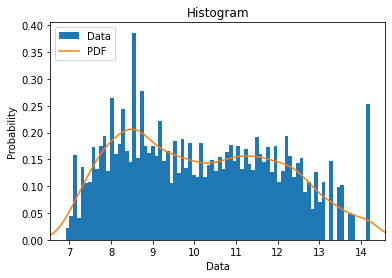

In [47]:
plt.hist(log_final_df['SQFT'], density=True, bins=82, label="Data")
mn, mx = plt.xlim()
plt.xlim(mn, mx)
kde_xs = np.linspace(mn, mx, 300)
kde = st.gaussian_kde(log_final_df['SQFT'])
plt.plot(kde_xs, kde.pdf(kde_xs), label="PDF")
plt.legend(loc="upper left")
plt.ylabel("Probability")
plt.xlabel("Data")
plt.title("Histogram");

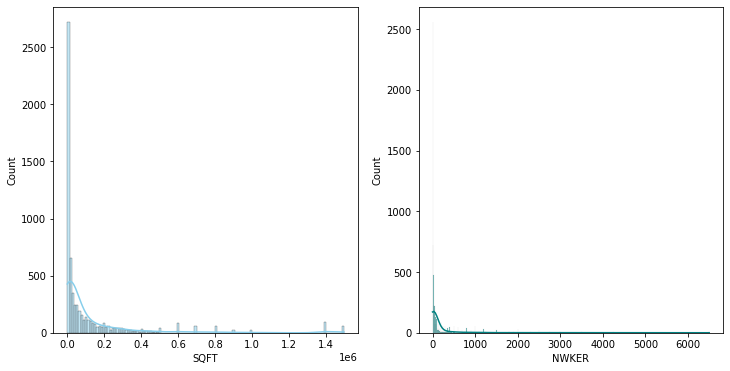

In [67]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

sns.histplot(data=final_df, x="SQFT", kde=True, color="skyblue", ax=axs[0])
sns.histplot(data=final_df, x="NWKER", kde=True, color="teal", ax=axs[1])

fig.figure.savefig("before.png")
plt.show()

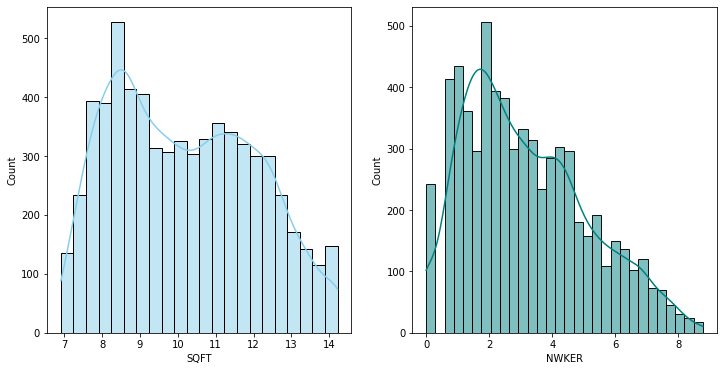

In [68]:
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

sns.histplot(data=log_final_df, x="SQFT", kde=True, color="skyblue", ax=axs[0])
sns.histplot(data=log_final_df, x="NWKER", kde=True, color="teal", ax=axs[1])

fig.figure.savefig("after.png")
plt.show()

# PCA

In [10]:
trim_df = pd.read_csv("outputs/trim_df.csv")
trim_df['X']=trim_df['Unnamed: 0']
trim_df.drop(list(filter(lambda x: x.startswith('Unname'), trim_df)), axis = 1, inplace = True)
trim_df.set_index('X', inplace=True)
trim_df.shape

(6501, 1513)

In [11]:
trim_df.head()

,SQFT,BASEMNT,ACT1PCT,ACT2PCT,ACT3PCT,EDSEAT,FDSEAT,OCCUPYP,LODOCCP,WKHRS,...,RFGCOMPN,RFGCOMPN_bin.2,SERVERN_bin..1,SERVERN,SERVERN_bin.2,TVVIDEON_bin..1,TVVIDEON,TVVIDEON_bin.2,DD,NEUI
X,,,,,,,,,,,,,,,,,,,,,
0,2400.0,0.0,100,0,0,0,0,0,0,16,...,0.0,0,0,0,0,0,0.0,0.0,7747,0.000001
1,114000.0,0.0,100,0,0,0,0,42,0,72,...,10.0,0,0,7,0,0,49.0,0.0,5293,0.000010
2,2550.0,0.0,100,0,0,0,0,0,0,40,...,0.0,0,0,0,0,0,0.0,0.0,5978,0.000003
3,500000.0,1.0,100,0,0,0,0,0,56,168,...,8.0,0,0,4,0,0,0.0,1.0,4689,0.000021
4,30000.0,0.0,50,50,0,0,0,100,0,65,...,2.0,0,0,10,0,0,1.0,0.0,4957,0.000013


In [12]:
# Min Max Scaler
names = trim_df.columns
indexes = trim_df.index
sc = MinMaxScaler((0, 1))
df = sc.fit_transform(trim_df)
data_scaled = pd.DataFrame(df, columns=names, index=indexes)
data_scaled.drop('NEUI', axis=1, inplace=True)
data_scaled.head()

,SQFT,BASEMNT,ACT1PCT,ACT2PCT,ACT3PCT,EDSEAT,FDSEAT,OCCUPYP,LODOCCP,WKHRS,...,XRAYN_bin.2,RFGCOMPN,RFGCOMPN_bin.2,SERVERN_bin..1,SERVERN,SERVERN_bin.2,TVVIDEON_bin..1,TVVIDEON,TVVIDEON_bin.2,DD
X,,,,,,,,,,,,,,,,,,,,,
0,0.000933,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.00,0.00,0.095238,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000,0.0,0.669192
1,0.075383,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.42,0.00,0.428571,...,0.0,0.022857,0.0,0.0,0.018667,0.0,0.0,0.245,0.0,0.399758
2,0.001033,0.000000,1.000000,0.000000,0.0,0.0,0.0,0.00,0.00,0.238095,...,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000,0.0,0.474967
3,0.332888,0.142857,1.000000,0.000000,0.0,0.0,0.0,0.00,0.56,1.000000,...,0.0,0.018286,0.0,0.0,0.010667,0.0,0.0,0.000,1.0,0.333443
4,0.019346,0.000000,0.494949,0.675676,0.0,0.0,0.0,1.00,0.00,0.386905,...,0.0,0.004571,0.0,0.0,0.026667,0.0,0.0,0.005,0.0,0.362868


In [13]:
# Instantiate PCA
pca = PCA()
df_pca = pca.fit_transform(data_scaled)

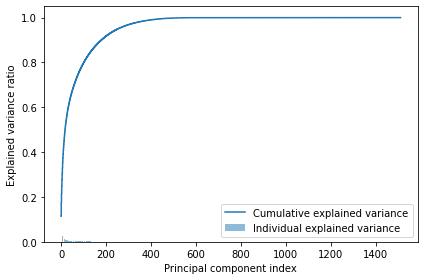

In [15]:
# Determine explained variance using explained_variance_ration_ attribute
exp_var_pca = pca.explained_variance_ratio_
# Cumulative sum of eigenvalues; This will be used to create step plot
# for visualizing the variance explained by each principal component.
#
cum_sum_eigenvalues = np.cumsum(exp_var_pca)
#
# Create the visualization plot
#
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.savefig('pca.png')
plt.show()

In [7]:
pca_df = PCA(n_components=2)
pca_f_df = pca_df.fit_transform(data_scaled)

In [8]:
p_df = pd.DataFrame(data = pca_f_df
             , columns = ['pc_1', 'pc_2'])

In [9]:
p_df.tail()

,pc_1,pc_2
6496,6.719661,2.039928
6497,-5.772900,7.227811
6498,-4.338662,4.086808
6499,-1.972223,-2.391314
6500,5.705966,0.365449


In [10]:
# Calculate the variance explained by priciple components
print('Variance of each component:', pca_df.explained_variance_ratio_)
print('\n Total Variance Explained:', round(sum(list(pca_df.explained_variance_ratio_))*100, 2))

Variance of each component: [0.11381843 0.05980362]

 Total Variance Explained: 17.36


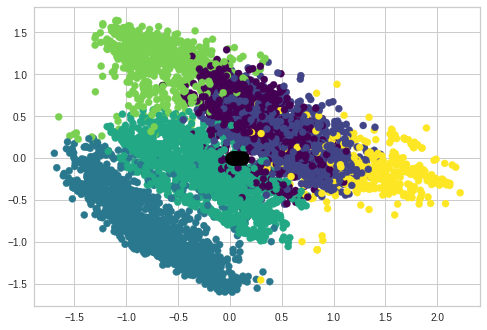

In [75]:
plt.scatter(pca_f_df[:, 0], pca_f_df[:, 1], c=y_kmeans, s=50, cmap='viridis')
plt.scatter(centeroids[:, 0], centeroids[:, 1], c='black', s=200, alpha=1);